<img style="float: left;padding: 1.3em" src="https://indico.in2p3.fr/event/18313/logo-786578160.png">  

# 2nd g2net training school - [CA17137](www.g2net.eu)
## CA17137 - A network for Gravitational Waves, Geophysics and Machine Learning


A talk by [Eftim Zdravevski, Ph.D.](https://scholar.google.com/citations?user=1EToDhEAAAAJ&hl=en)

[E-mail me for any comments.](eftim@finki.ukim.mk)

## Signal Processing Exercises - g2net school - Malta March 9, 2020

To run a following cell (shortcut: `ctrl`+`Enter` or `Shift`+`Enter`) and continue with the exercises below.

## Short introduction to pandas

- Pandas is a high-level data manipulation tool.
- It is built on the Numpy package and its key data structure is called the DataFrame.
- DataFrames allow you to store and manipulate tabular data in rows of observations and columns of variables.
- DataFrames can be easily loaded from a veriety of files (CSV, Excel, etc), and likewise exported..
- Easy visualization with other libraries such as matplotlib, seaborn, plotly.
- Matrix operations with numpy, scipy...
- SQL-like operations (filtering, groupping, slicing, joining)
- [Installation guide](https://pandas.pydata.org/docs/getting_started/install.html)
- [Getting started](https://pandas.pydata.org/docs/getting_started/index.html)


In [3]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Let's load some data

In [4]:
import pandas as pd
df = pd.read_csv('mhealth-sample.csv', sep=',', header=0)
df.head()


,chest_accelerometer_x,chest_accelerometer_y,ECG,Left_ankle_acceleration_x,Left_ankle_acceleration_y,class
0,-9.7788,0.55690,0.008373,0.37683,-9.0618,standing
1,-9.7733,0.27880,-0.025118,0.40179,-9.2048,standing
2,-9.8609,0.11561,0.025118,0.48141,-9.1945,standing
3,-9.7409,0.17652,0.180010,0.42919,-9.1746,standing
4,-9.7821,0.21637,0.092098,0.40038,-9.2039,standing


-------------
## MHEALTH Activity Recognition Dataset
The MHEALTH dataset is a recording of 10 subjects undergoing 12 different activities with various wearable sensors. The full dataset contains 1 matrix per subject, indexed by time (order of 100,000 timepoints, 50Hz resolution) and sensor. Each point in time is also given an activity classification. For these exercises, we are interested in a reduced scope: only 5 measurement channels of the first individual. The measurements are also restricted to 4 activities: standing, walking, running, climbing stairs. The activities and channels are coded as:

<table>
	<td>
        <div align="center"> <strong>Activity Codes </strong></div>
		<table border="1" class="dataframe">
		  <thead>
		    <tr style="text-align: right;">
		      <th>Activity Class</th>
		      <th>Class Name</th>
		    </tr>
		  </thead>
		  <tbody>
		    <tr>
		      <td>1</td>
		      <td>Standing</td>
		    </tr>
		    <tr>
		      <td>2</td>
		      <td>Walking</td>
		    </tr>
		    <tr>
		      <td>3</td>
		      <td>Climbing Stairs</td>
		    </tr>
		    <tr>
		      <td>4</td>
		      <td>Running</td>
		    </tr>
		  </tbody>
		</table>
	</td>
    <td>
		<table border="10" cellpadding="40">
            <tr> 
                <td colspan="30" height="20"></td> 
                <td colspan="30" height="20"></td>
                <td colspan="300" height="200"></td>
                <td colspan="300" height="200"></td>
                <td colspan="300" height="200"></td>
            </tr> 
		</table>
	</td>
	<td>
        <div align="center"> <strong> Channels </strong></div>
		<table border="1" class="dataframe">
		  <thead>
		    <tr style="text-align: right;">
		      <th>Channel</th>
		      <th>Description</th>
		    </tr>
		  </thead>
		  <tbody>
		    <tr>
		      <td>1</td>
		      <td>Chest Acceleration (X)</td>
		    </tr>
		    <tr>
		      <td>2</td>
		      <td>Chest Acceleration (Y)</td>
		    </tr>
		    <tr>
		      <td>3</td>
		      <td>ECG (Lead 1)</td>
		    </tr>
		    <tr>
		      <td>4</td>
		      <td>Left ankle accel. (X)</td>
		    </tr>
		    <tr>
		      <td>5</td>
		      <td>Right arm accel. (Y)</td>
		    </tr>
		  </tbody>
		</table>
	</td>
</table>

Here X,Y refer to the co-ordinate direction of the measurement. The full dataset can be explored and downloaded from the [UCI ML Repository](https://archive.ics.uci.edu/ml/datasets/MHEALTH+Dataset#) if desired. The different classes are each performed in a single block in the original data. We have spliced together the activities such that they are now performed in multiple blocks, but note that the ECG is not adjusted for the cooldown periods, meaning the subject has a rather magical heart.

### Showing some descriptive statistics about each column

In [5]:
df.describe()

,chest_accelerometer_x,chest_accelerometer_y,ECG,Left_ankle_acceleration_x,Left_ankle_acceleration_y
count,12288.000000,12288.000000,12288.000000,12288.000000,12288.000000
mean,-9.325865,0.637457,-0.061040,-2.722196,-7.453632
std,5.052521,2.192785,0.767291,6.302722,6.511846
min,-22.303000,-13.574000,-4.563100,-19.373000,-18.932000
25%,-10.515250,-0.015034,-0.154890,-4.400600,-9.828125
50%,-9.661600,0.398315,-0.016745,-1.101950,-9.054750
75%,-8.012700,1.189025,0.121400,0.452140,-7.538975
max,9.910000,20.713000,4.764000,25.015000,21.838000


Let's get some descriptive data, we'll need it down below...

In [6]:
classes = sorted(set(df['class'].values))
data_columns = [c for c in df.columns if c!='class']
classes, data_columns

(['climbing_stairs', 'running', 'standing', 'walking'],
 ['chest_accelerometer_x',
  'chest_accelerometer_y',
  'ECG',
  'Left_ankle_acceleration_x',
  'Left_ankle_acceleration_y'])

### Let's generate a timestamp column based on the index and frequency

In [7]:
frequency=50 # Hz
total_length_seconds = len(df)/frequency
df["timestamp"]=df.index/frequency
df.set_index('timestamp',inplace=True)
# df.reindex(df['timestamp'])
total_length_seconds

245.76

In [8]:
df.head()

,chest_accelerometer_x,chest_accelerometer_y,ECG,Left_ankle_acceleration_x,Left_ankle_acceleration_y,class
timestamp,,,,,,
0.00,-9.7788,0.55690,0.008373,0.37683,-9.0618,standing
0.02,-9.7733,0.27880,-0.025118,0.40179,-9.2048,standing
0.04,-9.8609,0.11561,0.025118,0.48141,-9.1945,standing
0.06,-9.7409,0.17652,0.180010,0.42919,-9.1746,standing
0.08,-9.7821,0.21637,0.092098,0.40038,-9.2039,standing


### Plotting from pandas using matplotlib
More information [here](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.plot.html).

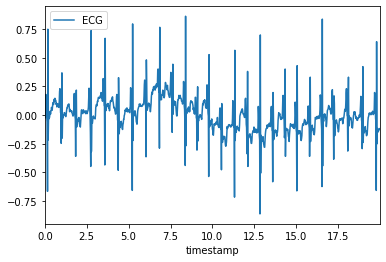

In [9]:
#Basic plotting with matplotlib
dft=df.iloc[:1000,:]
dft.plot(kind='line',  y='ECG')

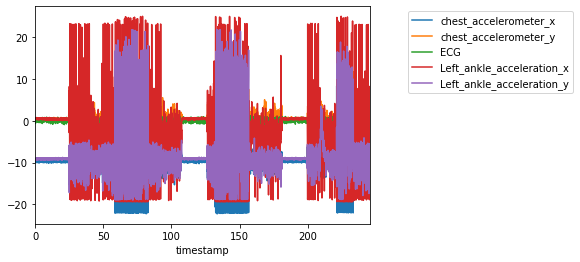

In [10]:
# Plot full dataset
import matplotlib as plt
ax = df[data_columns].plot()
ax.legend(bbox_to_anchor=(1.1, 1)) # move legend outside

# Visualizing data using plotly and cufflinks

- Plotly is [an interactive visualization tool](https://plot.ly/)
- [Cufflinks binds Plotly directly to pandas dataframes](https://plot.ly/python/v3/ipython-notebooks/cufflinks/), mimicing regular matplotlib functionalities but in an interactive way.

In [11]:
# import chart_studio.plotly as py
import cufflinks as cf
import plotly.figure_factory as ff
#importing plotly and cufflinks in offline mode
import plotly.offline as py
cf.go_offline()
cf.set_config_file(offline=True, world_readable=True)

### Creating an interactive table

In [12]:
table = ff.create_table(df.iloc[:100, :])  # note this is a sample for speed (and maybe some restrictions of the free version)
py.iplot(table)

### Creating a line plot

In [13]:
df.iplot(kind='scatter', xaxis_title="Timestamp [s]")

### Histograms and binning

First create some new columns in the data frame that represent different activities and sensor channels

In [14]:
ecg_columns=[]
activity_columns = []
for c in classes:
    for column in data_columns:
        new_column = c+'_' + column
        activity_columns.append(new_column)
        df[new_column]=df[df["class"]==c][column]
        if column=='ECG':
            ecg_columns.append(new_column)

#### Plot some of the columns in a histogram with 20 bins

In [15]:
df[ecg_columns].iplot(kind="histogram", bins=20, theme="white", title="ECG distribution per activity", xTitle='ECG', yTitle='Count')

### Plotting the sensor values for each activity

In [16]:
df[activity_columns].iplot(kind='scatter', xaxis_title="Timestamp [s]")

### Storing charts externally

- Plot the data using a helper function that utilizes plotly
- We don't want all charts to be in the jupyter notebook as it gets really heavy

In [17]:
from dataframe_plot import generate_scatter_plot

In [18]:
generate_scatter_plot(df, data_columns, 'all_data.html', mode='lines+markers')

In [19]:
generate_scatter_plot(df, activity_columns, 'all_data_per_activity.html', mode='lines')

### Calculating and plotting correlations

In [20]:
df_corr=df[data_columns].corr()

In [21]:
df_corr.head()

,chest_accelerometer_x,chest_accelerometer_y,ECG,Left_ankle_acceleration_x,Left_ankle_acceleration_y
chest_accelerometer_x,1.000000,-0.240192,-0.171807,-0.092555,0.183911
chest_accelerometer_y,-0.240192,1.000000,-0.001695,0.076507,0.198451
ECG,-0.171807,-0.001695,1.000000,0.005773,-0.132307
Left_ankle_acceleration_x,-0.092555,0.076507,0.005773,1.000000,0.172223
Left_ankle_acceleration_y,0.183911,0.198451,-0.132307,0.172223,1.000000


In [22]:
df_corr.iplot(kind='heatmap',colorscale="Blues", title="Channel Correlation Matrix")
